In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt

def draw_csv_and_yolo_annotations(csv_path, image_dir, yolo_dir, image_ext=".jpg", img_size=1024):
    df = pd.read_csv(csv_path)
    df = df[df["Severity"].isin(["B", "M"])].copy()
    grouped = df.groupby("ID")

    for image_id, group in grouped:
        image_path = os.path.join(image_dir, image_id + image_ext)
        yolo_path = os.path.join(yolo_dir, image_id + ".txt")

        if not os.path.exists(image_path):
            print(f"Image not found: {image_path}")
            continue

        img_csv = cv2.imread(image_path)
        img_yolo = cv2.imread(image_path)

        if img_csv is None or img_yolo is None:
            print(f"Failed to read image: {image_path}")
            continue

        # --- Draw CSV Annotations ---
        for _, row in group.iterrows():
            x = int(row["X"])
            y = img_size - int(row["Y"])  # Flip Y
            r = int(row["Radius"])
            ab_type = row["Abnormality Type"]

            cv2.rectangle(img_csv, (x - r, y - r), (x + r, y + r), (0, 255, 0), 2)
            cv2.putText(img_csv, ab_type, (x - r, y - r - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        # --- Draw YOLO Annotations ---
        if os.path.exists(yolo_path):
            with open(yolo_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) != 5:
                        continue
                    cls, x_center, y_center, width, height = map(float, parts)

                    x_center *= img_size
                    y_center *= img_size
                    width *= img_size
                    height *= img_size

                    x1 = int(x_center - width / 2)
                    y1 = int(y_center - height / 2)
                    x2 = int(x_center + width / 2)
                    y2 = int(y_center + height / 2)

                    cv2.rectangle(img_yolo, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(img_yolo, f"Class {int(cls)}", (x1, y1 - 10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        # Convert to RGB for display
        img_csv_rgb = cv2.cvtColor(img_csv, cv2.COLOR_BGR2RGB)
        img_yolo_rgb = cv2.cvtColor(img_yolo, cv2.COLOR_BGR2RGB)

        # Display side-by-side
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img_csv_rgb)
        plt.title(f"{image_id} - CSV Annotations")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(img_yolo_rgb)
        plt.title(f"{image_id} - YOLO Annotations")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

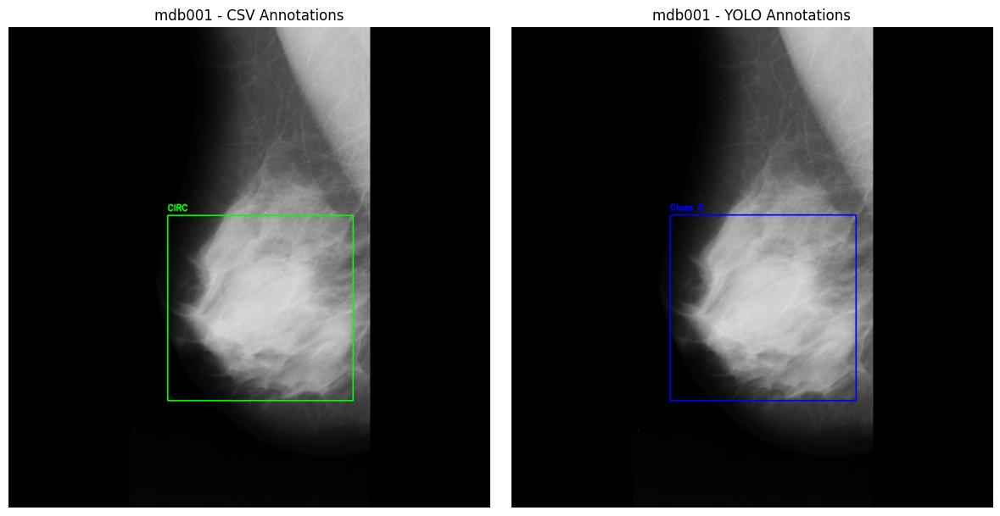

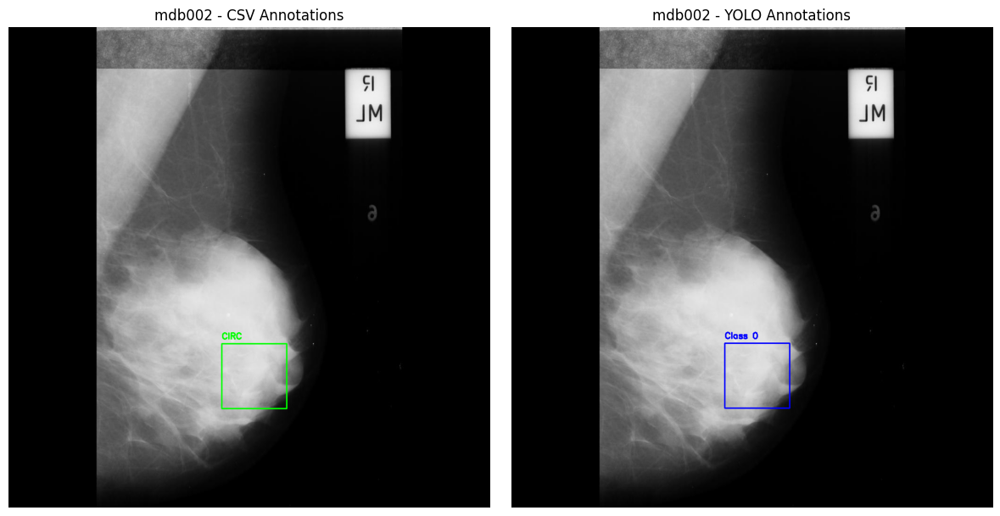

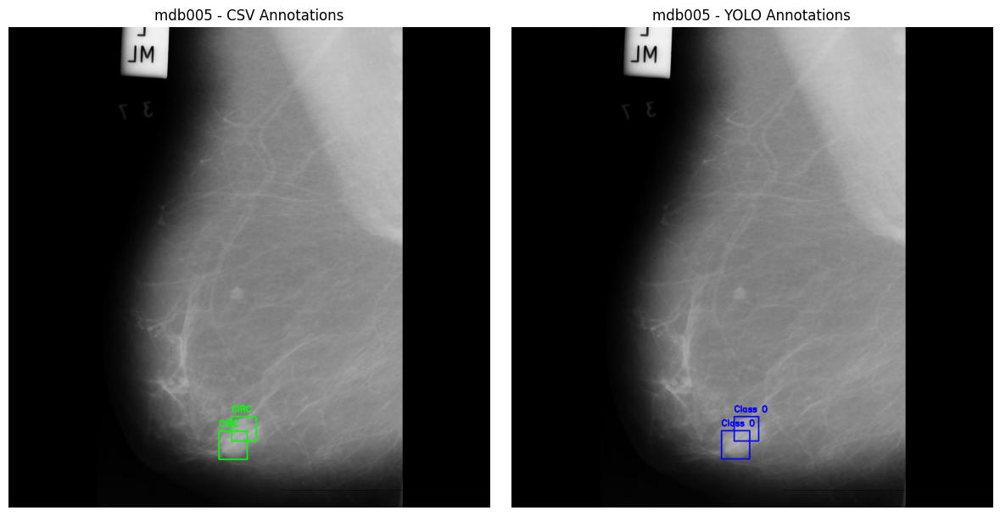

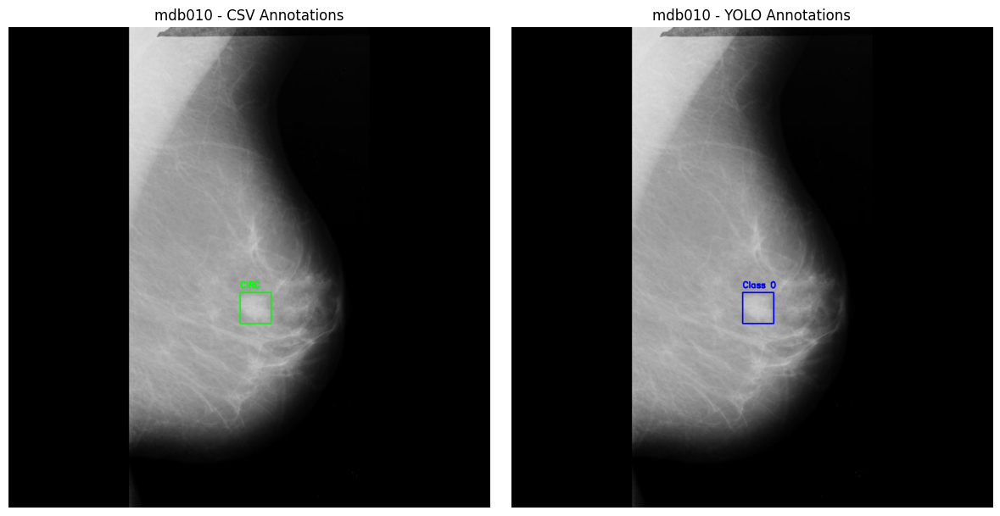

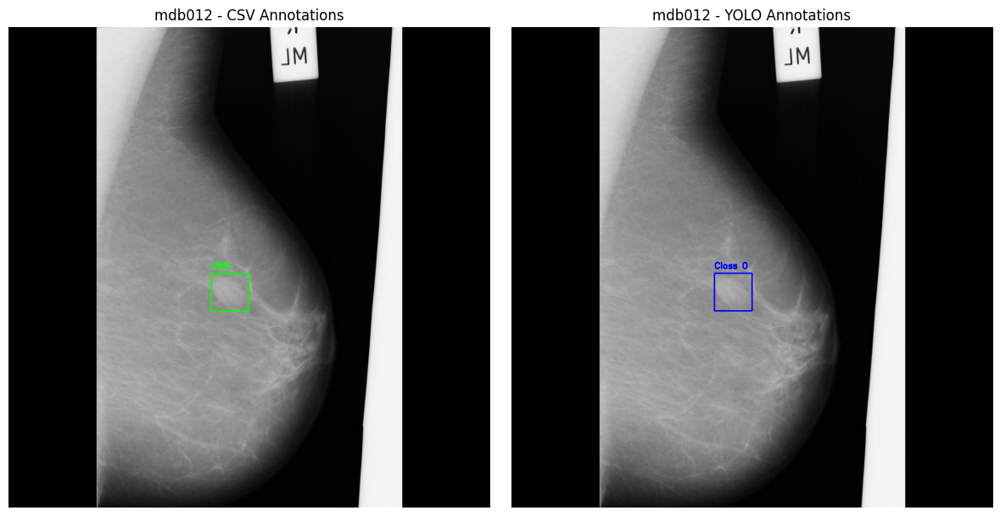

...

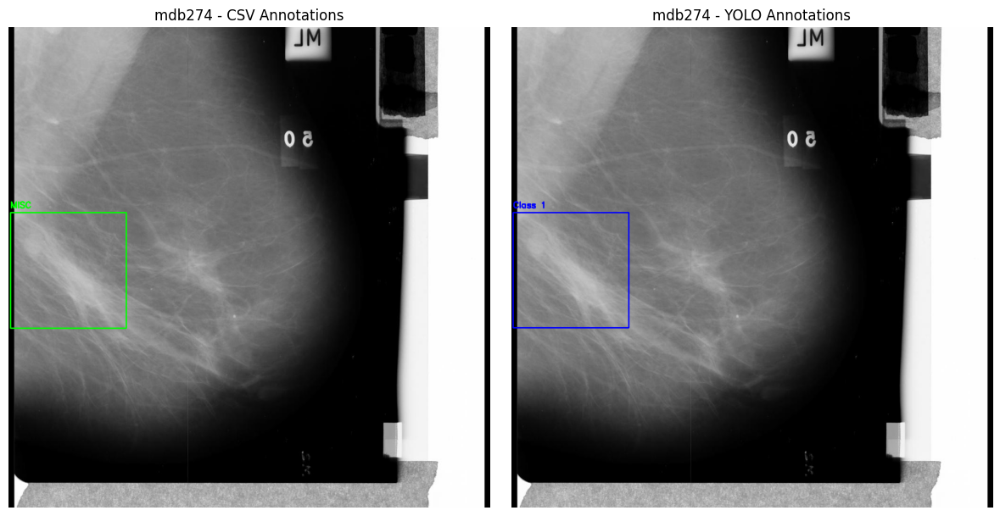

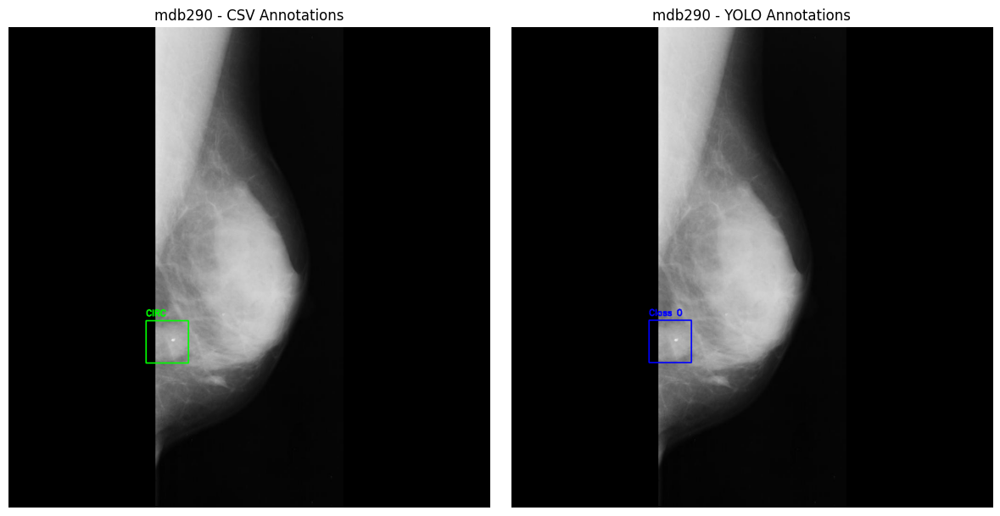

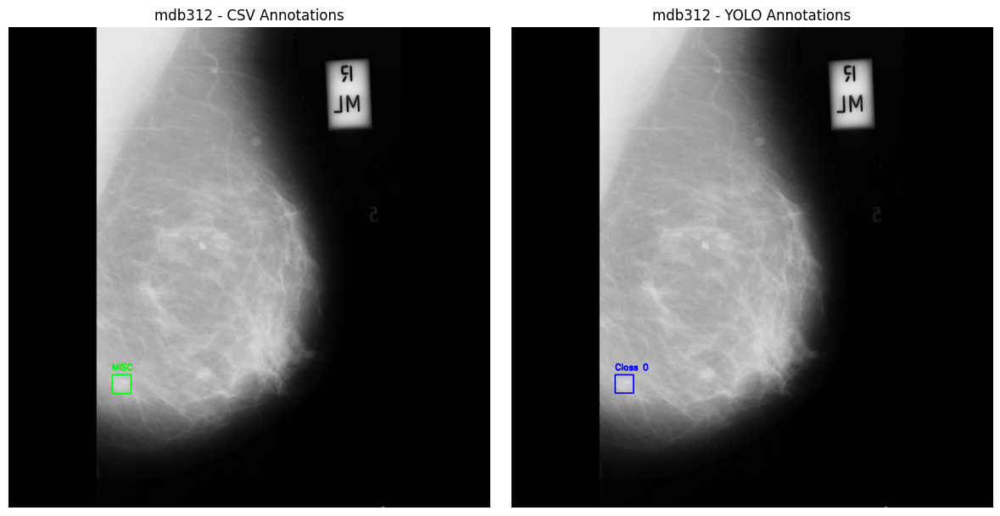

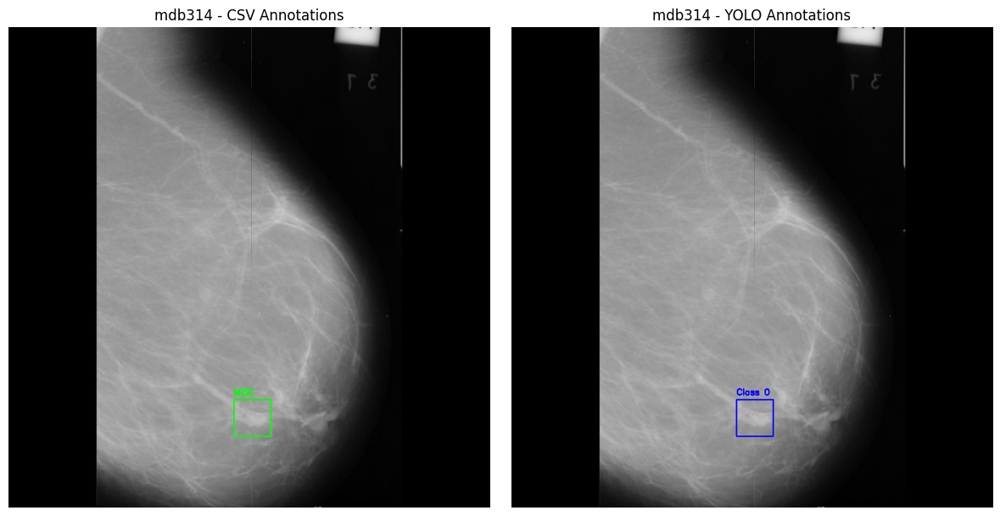

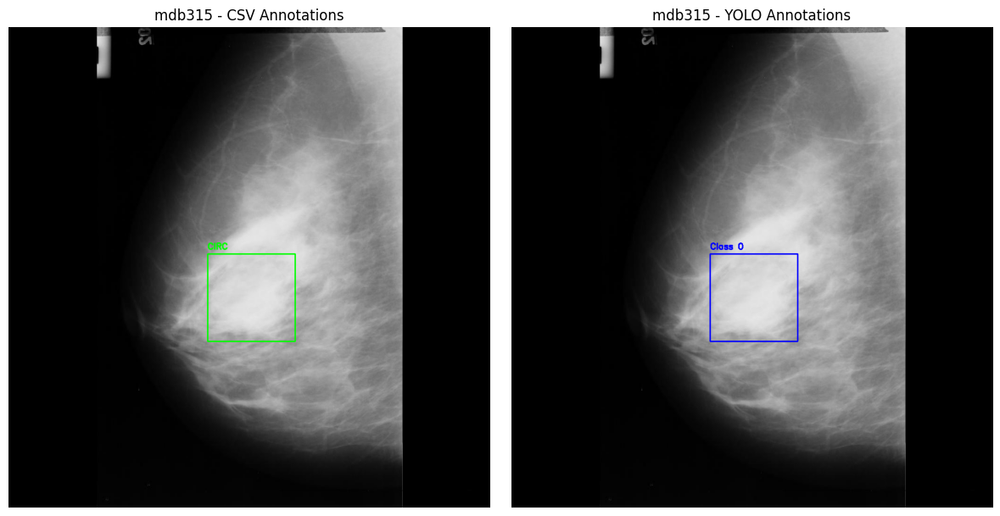

In [4]:
draw_csv_and_yolo_annotations(
    csv_path='/content/drive/MyDrive/MIAS_third_try/filtered_info.csv',
    image_dir='/content/drive/MyDrive/MIAS_third_try/RGB_jpg_images',
    yolo_dir='/content/drive/MyDrive/MIAS_third_try/YOLO_labels2',
    image_ext='.jpg',  # or .jpg if you converted them
    img_size=1024)